<a href="https://colab.research.google.com/github/codehvb/Excel-projects/blob/main/DLA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
#@title Setup
!pip -q install nltk tqdm pillow matplotlib

import nltk
nltk.download("punkt")
nltk.download("punkt_tab")

import os, json, random, math, re
from pathlib import Path
from collections import Counter, defaultdict

import numpy as np
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

import torchvision.transforms as T
import torchvision.models as models

import matplotlib.pyplot as plt
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


Device: cuda


In [3]:
#@title Config
ROOT = "/content"
DATA_DIR = f"{ROOT}/coco_mini"
IMG_DIR  = f"{DATA_DIR}/train2014"
ANN_DIR  = f"{DATA_DIR}/annotations"

os.makedirs(IMG_DIR, exist_ok=True)
os.makedirs(ANN_DIR, exist_ok=True)

# Light subset size (real COCO). Recommended:
# 1000 = fast, 5000 = good, 10000 = heavier
SUBSET_IMAGES = 5000

# Training
BATCH_SIZE = 64
EPOCHS = 10
LR = 1e-4
MAX_LEN = 25  # caption max tokens including <start>/<end>

print("SUBSET_IMAGES:", SUBSET_IMAGES, "EPOCHS:", EPOCHS)


SUBSET_IMAGES: 5000 EPOCHS: 10


In [4]:
#@title Download COCO captions + build subset list (no pycocotools)
import zipfile, urllib.request

ANN_ZIP_URL = "http://images.cocodataset.org/annotations/annotations_trainval2014.zip"
ANN_ZIP_PATH = f"{ANN_DIR}/annotations_trainval2014.zip"
CAPTIONS_JSON = f"{ANN_DIR}/captions_train2014.json"

if not os.path.exists(ANN_ZIP_PATH):
    print("Downloading annotations zip...")
    urllib.request.urlretrieve(ANN_ZIP_URL, ANN_ZIP_PATH)
else:
    print("Annotations zip already exists.")

if not os.path.exists(CAPTIONS_JSON):
    print("Extracting captions_train2014.json ...")
    with zipfile.ZipFile(ANN_ZIP_PATH, "r") as z:
        z.extract("annotations/captions_train2014.json", ANN_DIR)
    os.replace(f"{ANN_DIR}/annotations/captions_train2014.json", CAPTIONS_JSON)
else:
    print("Captions JSON already exists.")

with open(CAPTIONS_JSON, "r") as f:
    coco_ann = json.load(f)

# Map image_id -> file_name
id2file = {img["id"]: img["file_name"] for img in coco_ann["images"]}

# Map image_id -> list of captions
img2caps = defaultdict(list)
for ann in coco_ann["annotations"]:
    img2caps[ann["image_id"]].append(ann["caption"])

all_img_ids = sorted(list(img2caps.keys()))
print("Total train2014 images with captions:", len(all_img_ids))

# Deterministic subset
selected_ids = all_img_ids[:SUBSET_IMAGES]
print("Selected subset images:", len(selected_ids))

# Save a mini annotation json (optional)
MINI_JSON = f"{ANN_DIR}/coco_mini_captions_train2014.json"
mini = {
    "images": [{"id": i, "file_name": id2file[i]} for i in selected_ids],
    "annotations": [{"image_id": i, "caption": c} for i in selected_ids for c in img2caps[i]]
}
with open(MINI_JSON, "w") as f:
    json.dump(mini, f)
print("Saved mini annotations:", MINI_JSON)


Extracting captions_train2014.json ...
Total train2014 images with captions: 82783
Selected subset images: 5000
Saved mini annotations: /content/coco_mini/annotations/coco_mini_captions_train2014.json


In [5]:
#@title Download subset images (real COCO train2014)
BASE_IMG_URL = "http://images.cocodataset.org/train2014/"

def download_images(image_ids, id2file, target_dir):
    missing = []
    for img_id in image_ids:
        fn = id2file[img_id]
        path = os.path.join(target_dir, fn)
        if not os.path.exists(path):
            missing.append((img_id, fn))
    print("Images to download:", len(missing))

    for _, fn in tqdm(missing, desc="Downloading"):
        url = BASE_IMG_URL + fn
        out = os.path.join(target_dir, fn)
        # using wget (more robust than urllib for large batches)
        !wget -q -O "{out}" "{url}"

download_images(selected_ids, id2file, IMG_DIR)

print("Downloaded jpg count:", len([x for x in os.listdir(IMG_DIR) if x.endswith(".jpg")]))


Images to download: 5000


Downloading: 100%|██████████| 5000/5000 [40:58<00:00,  2.03it/s]

Downloaded jpg count: 5000


In [6]:
#@title Vocabulary
from nltk.tokenize import word_tokenize
import nltk
nltk.download("punkt_tab")

def clean_caption(s: str) -> str:
    s = s.lower().strip()
    # keep words and basic punctuation as tokens; simple cleanup
    s = re.sub(r"\s+", " ", s)
    return s

class Vocab:
    def __init__(self, min_freq=2, max_size=10000):
        self.min_freq = min_freq
        self.max_size = max_size
        self.stoi = {"<pad>":0, "<start>":1, "<end>":2, "<unk>":3}
        self.itos = {0:"<pad>", 1:"<start>", 2:"<end>", 3:"<unk>"}

    def build(self, captions):
        counter = Counter()
        for c in captions:
            tokens = word_tokenize(clean_caption(c))
            counter.update(tokens)

        idx = 4
        for w, f in counter.most_common():
            if f < self.min_freq:
                continue
            if idx >= self.max_size:
                break
            self.stoi[w] = idx
            self.itos[idx] = w
            idx += 1

    def encode(self, caption):
        tokens = word_tokenize(clean_caption(caption))
        ids = [self.stoi.get(t, self.stoi["<unk>"]) for t in tokens]
        return [self.stoi["<start>"]] + ids + [self.stoi["<end>"]]

    def decode(self, ids):
        words = []
        for i in ids:
            if i == self.stoi["<end>"]:
                break
            if i in (self.stoi["<start>"], self.stoi["<pad>"]):
                continue
            words.append(self.itos.get(i, "<unk>"))
        return " ".join(words)

all_caps = [a["caption"] for a in mini["annotations"]]
vocab = Vocab(min_freq=2, max_size=12000)
vocab.build(all_caps)
print("Vocab size:", len(vocab.stoi))


[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


Vocab size: 4308


In [7]:
#@title Dataset and DataLoader
class CocoMiniDataset(Dataset):
    def __init__(self, img_dir, mini_json, vocab, transform=None, max_len=25):
        with open(mini_json, "r") as f:
            data = json.load(f)
        self.id2file = {img["id"]: img["file_name"] for img in data["images"]}
        self.samples = [(ann["image_id"], ann["caption"]) for ann in data["annotations"]]
        self.img_dir = img_dir
        self.vocab = vocab
        self.transform = transform
        self.max_len = max_len

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_id, cap = self.samples[idx]
        fn = self.id2file[img_id]
        path = os.path.join(self.img_dir, fn)

        image = Image.open(path).convert("RGB")
        if self.transform:
            image = self.transform(image)

        seq = self.vocab.encode(cap)
        if len(seq) > self.max_len:
            seq = seq[:self.max_len]
            seq[-1] = self.vocab.stoi["<end>"]

        length = len(seq)
        pad = [self.vocab.stoi["<pad>"]] * (self.max_len - length)
        seq = seq + pad

        return image, torch.tensor(seq, dtype=torch.long), length, fn, cap

transform = T.Compose([
    T.Resize((224,224)),
    T.ToTensor(),
    T.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
])

ds = CocoMiniDataset(IMG_DIR, MINI_JSON, vocab, transform=transform, max_len=MAX_LEN)
dl = DataLoader(ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)

print("Training samples (image,caption pairs):", len(ds))


Training samples (image,caption pairs): 25015


In [8]:
#@title Model (Encoder + Attention + LSTM Decoder)
class EncoderCNN(nn.Module):
    def __init__(self, encoded_size=14):
        super().__init__()
        resnet = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        modules = list(resnet.children())[:-2]  # remove avgpool+fc
        self.backbone = nn.Sequential(*modules)
        self.pool = nn.AdaptiveAvgPool2d((encoded_size, encoded_size))
        self.enc_dim = 2048
        self.encoded_size = encoded_size

    def forward(self, x):
        feat = self.backbone(x)                 # [B,2048,H/32,W/32]
        feat = self.pool(feat)                  # [B,2048,14,14]
        B,C,H,W = feat.shape
        feat = feat.view(B, C, H*W).permute(0,2,1)  # [B,196,2048]
        return feat, (H, W)

class Attention(nn.Module):
    def __init__(self, enc_dim, dec_dim, attn_dim):
        super().__init__()
        self.enc_attn = nn.Linear(enc_dim, attn_dim)
        self.dec_attn = nn.Linear(dec_dim, attn_dim)
        self.full_attn = nn.Linear(attn_dim, 1)

    def forward(self, enc_feats, hidden):
        # enc_feats: [B,S,enc_dim], hidden: [B,dec_dim]
        att1 = self.enc_attn(enc_feats)                  # [B,S,attn_dim]
        att2 = self.dec_attn(hidden).unsqueeze(1)        # [B,1,attn_dim]
        e = self.full_attn(torch.tanh(att1 + att2)).squeeze(2)  # [B,S]
        alpha = torch.softmax(e, dim=1)                  # [B,S]
        context = (enc_feats * alpha.unsqueeze(2)).sum(dim=1)   # [B,enc_dim]
        return context, alpha  # alpha is attention map weights

class DecoderLSTM(nn.Module):
    def __init__(self, vocab_size, enc_dim=2048, emb_dim=256, dec_dim=512, attn_dim=256, dropout=0.3):
        super().__init__()
        self.vocab_size = vocab_size
        self.emb = nn.Embedding(vocab_size, emb_dim)
        self.attn = Attention(enc_dim, dec_dim, attn_dim)
        self.lstm = nn.LSTMCell(emb_dim + enc_dim, dec_dim)
        self.fc = nn.Linear(dec_dim, vocab_size)
        self.drop = nn.Dropout(dropout)

        self.init_h = nn.Linear(enc_dim, dec_dim)
        self.init_c = nn.Linear(enc_dim, dec_dim)

    def init_hidden(self, enc_feats):
        mean_enc = enc_feats.mean(dim=1)     # [B,enc_dim]
        h = self.init_h(mean_enc)            # [B,dec_dim]
        c = self.init_c(mean_enc)
        return h, c

    def forward(self, enc_feats, captions):
        # captions: [B,T]
        B, T = captions.shape
        embeddings = self.emb(captions)      # [B,T,emb_dim]

        h, c = self.init_hidden(enc_feats)

        outputs = []
        alphas = []

        for t in range(T-1):  # predict next token
            context, alpha = self.attn(enc_feats, h)  # [B,enc_dim], [B,S]
            lstm_in = torch.cat([embeddings[:,t,:], context], dim=1)
            h, c = self.lstm(lstm_in, (h,c))
            out = self.fc(self.drop(h))      # [B,vocab]
            outputs.append(out)
            alphas.append(alpha)

        outputs = torch.stack(outputs, dim=1)   # [B,T-1,vocab]
        alphas = torch.stack(alphas, dim=1)     # [B,T-1,S]
        return outputs, alphas

class Captioner(nn.Module):
    def __init__(self, vocab_size):
        super().__init__()
        self.encoder = EncoderCNN(encoded_size=14)
        self.decoder = DecoderLSTM(vocab_size=vocab_size)

    def forward(self, images, captions):
        enc_feats, hw = self.encoder(images)
        logits, alphas = self.decoder(enc_feats, captions)
        return logits, alphas, hw

model = Captioner(vocab_size=len(vocab.stoi)).to(device)
print("Model ready.")


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 208MB/s]


Model ready.


In [9]:
#@title Train (Optimized, Stable)

# import torch
# import torch.nn as nn
# import torch.optim as optim

PAD_IDX = 0  # <pad> token index in your vocab
criterion = nn.CrossEntropyLoss(ignore_index=PAD_IDX)
optimizer = optim.Adam(model.parameters(), lr=LR)

use_amp = torch.cuda.is_available()  # mixed precision only on GPU
scaler = torch.cuda.amp.GradScaler(enabled=use_amp)

def train_one_epoch(model, dl):
    model.train()
    total_loss = 0.0

    for images, seq, lengths, _, _ in dl:
        images = images.to(device, non_blocking=True)
        seq = seq.to(device, non_blocking=True)

        # IMPORTANT: for your decoder implementation,
        # pass full seq so decoder predicts T-1 steps
        inp = seq                  # [B, T]
        tgt = seq[:, 1:]           # [B, T-1]

        optimizer.zero_grad(set_to_none=True)

        with torch.cuda.amp.autocast(enabled=use_amp):
            logits, _, _ = model(images, inp)          # [B, T-1, V]
            logits = logits.reshape(-1, logits.size(-1))  # [B*(T-1), V]
            tgt = tgt.reshape(-1)                         # [B*(T-1)]
            loss = criterion(logits, tgt)

        scaler.scale(loss).backward()

        # stability (helps avoid exploding gradients with LSTM)
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)

        scaler.step(optimizer)
        scaler.update()

        total_loss += float(loss.detach().cpu())

    return total_loss / len(dl)

for epoch in range(1, EPOCHS + 1):
    avg_loss = train_one_epoch(model, dl)
    print(f"Epoch {epoch}/{EPOCHS} - Loss: {avg_loss:.4f}")


/tmp/ipython-input-302134911.py:12: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=use_amp)
/tmp/ipython-input-302134911.py:29: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):


Epoch 1/10 - Loss: 4.9159
Epoch 2/10 - Loss: 3.9731
Epoch 3/10 - Loss: 3.5664
Epoch 4/10 - Loss: 3.3012
Epoch 5/10 - Loss: 3.1058
Epoch 6/10 - Loss: 2.9476
Epoch 7/10 - Loss: 2.8150
Epoch 8/10 - Loss: 2.6998
Epoch 9/10 - Loss: 2.5959
Epoch 10/10 - Loss: 2.5011


In [10]:
@torch.no_grad()
def generate_with_attention(model, pil_img, max_len=25, no_repeat_ngram=2):
    model.eval()
    img_t = transform(pil_img).unsqueeze(0).to(device)
    enc_feats, (H, W) = model.encoder(img_t)

    h, c = model.decoder.init_hidden(enc_feats)

    word = vocab.stoi["<start>"]
    seq = [word]
    attn_maps = []

    # store generated tokens after <start>
    gen = []

    for t in range(max_len):
        emb = model.decoder.emb(torch.tensor([word], device=device))
        context, alpha = model.decoder.attn(enc_feats, h)
        lstm_in = torch.cat([emb, context], dim=1)
        h, c = model.decoder.lstm(lstm_in, (h, c))

        logits = model.decoder.fc(h).squeeze(0)  # [V]

        # ---- no-repeat ngram blocking (bigram by default) ----
        if no_repeat_ngram == 2 and len(gen) >= 1:
            prev = gen[-1]
            banned_next = set()
            # if we've seen (prev -> x) before, ban x
            for i in range(len(gen) - 1):
                if gen[i] == prev:
                    banned_next.add(gen[i + 1])
            for b in banned_next:
                logits[b] = -1e9
        # ------------------------------------------------------

        next_word = int(torch.argmax(logits).item())

        seq.append(next_word)
        attn_maps.append(alpha.view(H, W).cpu().numpy())

        if next_word == vocab.stoi["<end>"]:
            break

        gen.append(next_word)
        word = next_word

    words = [vocab.itos[i] for i in seq]
    caption = vocab.decode(seq)
    return caption, words, attn_maps


# pick a random real COCO image from your subset
random_fn = random.choice([x for x in os.listdir(IMG_DIR) if x.endswith(".jpg")])
img_path = os.path.join(IMG_DIR, random_fn)
pil_img = Image.open(img_path).convert("RGB")

caption, words, attns = generate_with_attention(model, pil_img, max_len=MAX_LEN)
print("Generated caption:\n", caption)


Generated caption:
 two men standing next to a parking meter .


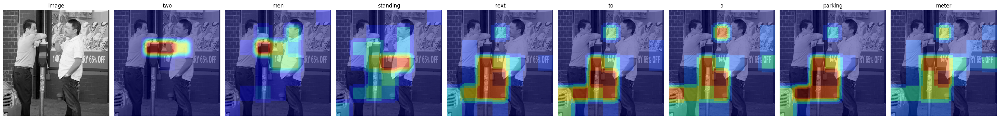

In [11]:
#@title Visualize per-word attention heatmaps
def show_word_attention(pil_img, words, attns, max_words=10):
    # remove special tokens from display (keep aligned attentns)
    # attns corresponds to generated words after <start>
    display = []
    for w, a in zip(words[1:], attns):  # skip <start>
        if w in ["<end>", "<pad>"]:
            break
        display.append((w, a))
    display = display[:max_words]

    wcount = len(display)
    plt.figure(figsize=(4*wcount, 4))

    # show original
    plt.subplot(1, wcount+1, 1)
    plt.imshow(pil_img)
    plt.title("Image")
    plt.axis("off")

    for i, (w, a) in enumerate(display, start=2):
        # upscale attention to image size
        att_img = Image.fromarray((a * 255).astype(np.uint8)).resize(pil_img.size, resample=Image.BILINEAR)
        att_np = np.array(att_img) / 255.0

        plt.subplot(1, wcount+1, i)
        plt.imshow(pil_img)
        plt.imshow(att_np, cmap="jet", alpha=0.45)
        plt.title(w)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

show_word_attention(pil_img, words, attns, max_words=8)



=== Image 1: COCO_train2014_000000014219.jpg ===
Generated caption: people are waiting to a train station .


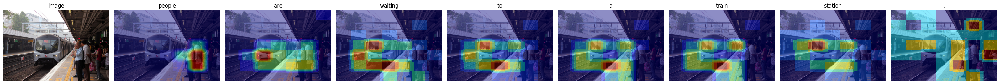


=== Image 2: COCO_train2014_000000027879.jpg ===
Generated caption: a giraffe standing in a field with a tree .


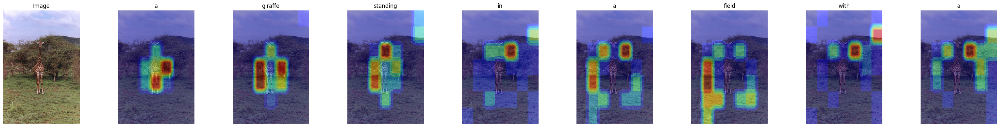


=== Image 3: COCO_train2014_000000026281.jpg ===
Generated caption: a black and white cat laying on a remote next to a chair .


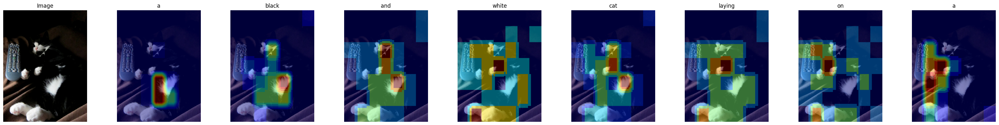


=== Image 4: COCO_train2014_000000025525.jpg ===
Generated caption: a man wearing a tie in a glass .


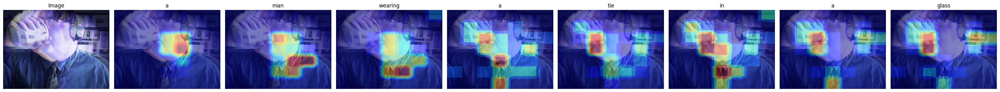


=== Image 5: COCO_train2014_000000030647.jpg ===
Generated caption: a vase is sitting on a window next to a glass window .


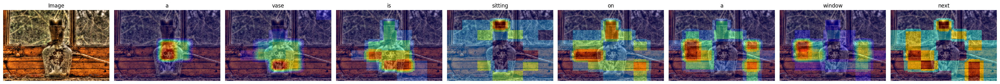


=== Image 6: COCO_train2014_000000019134.jpg ===
Generated caption: a man riding a skateboard on a ramp .


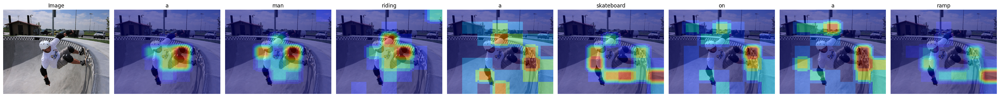


=== Image 7: COCO_train2014_000000028044.jpg ===
Generated caption: a large jet plane is parked on the runway .


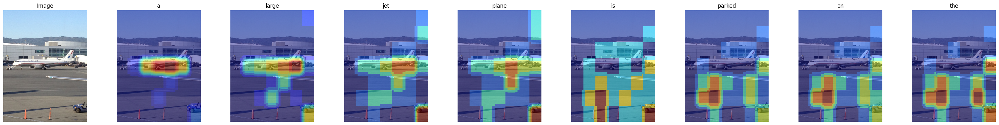


=== Image 8: COCO_train2014_000000019198.jpg ===
Generated caption: a person standing in a city with a window .


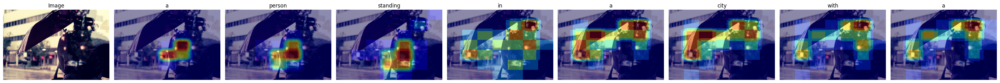


=== Image 9: COCO_train2014_000000001536.jpg ===
Generated caption: a pizza with a pan on a tray .


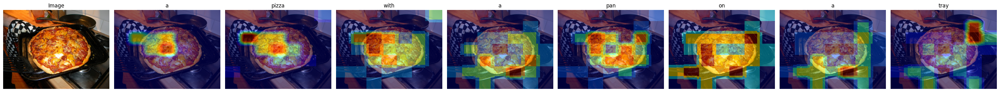


=== Image 10: COCO_train2014_000000001168.jpg ===
Generated caption: a red airplane is on the side of a building .


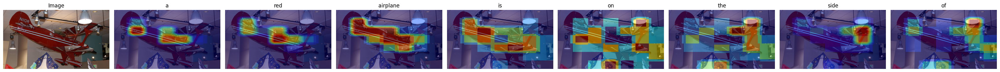


=== Image 11: COCO_train2014_000000021313.jpg ===
Generated caption: a black and white cat laying on a desk .


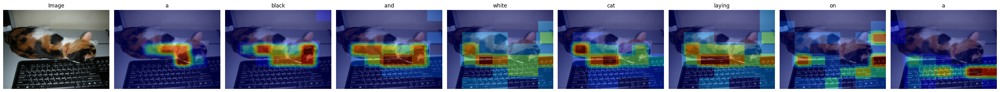


=== Image 12: COCO_train2014_000000016573.jpg ===
Generated caption: a giraffe standing in a field near a fence .


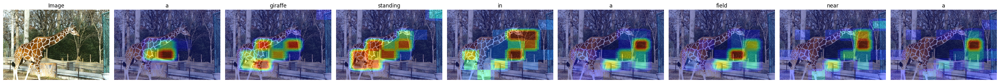


=== Image 13: COCO_train2014_000000004442.jpg ===
Generated caption: a girl sitting on a bed with a blanket on it .


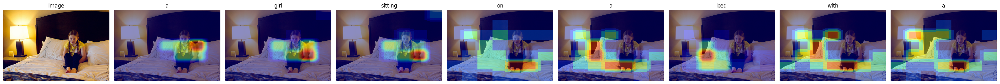


=== Image 14: COCO_train2014_000000021346.jpg ===
Generated caption: a giraffe standing in the middle of a tree .


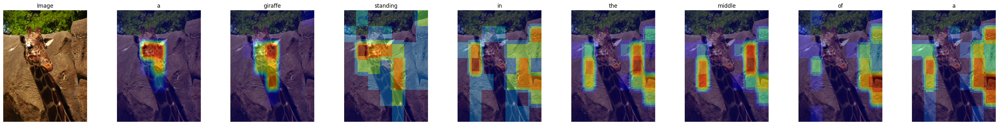


=== Image 15: COCO_train2014_000000022041.jpg ===
Generated caption: a cat is standing in a sink in the water .


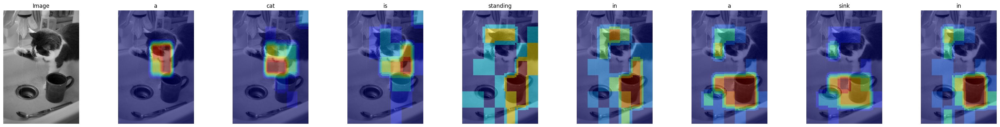


=== Image 16: COCO_train2014_000000032699.jpg ===
Generated caption: a kitchen with a stove and a sink and white cabinets .


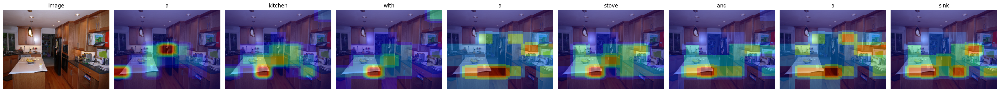


=== Image 17: COCO_train2014_000000031524.jpg ===
Generated caption: a street signs with a bunch of signs on it .


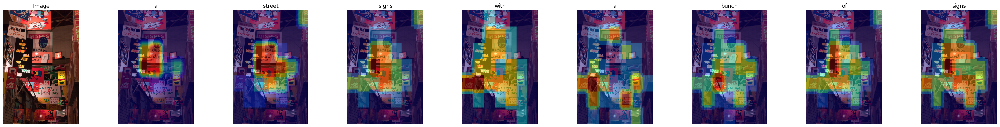


=== Image 18: COCO_train2014_000000025951.jpg ===
Generated caption: a pizza is sitting on a table .


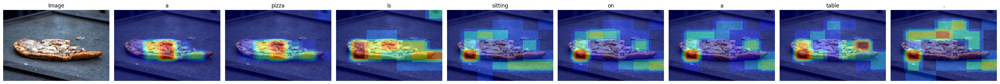


=== Image 19: COCO_train2014_000000032405.jpg ===
Generated caption: a cat sitting on a toilet in a bathroom .


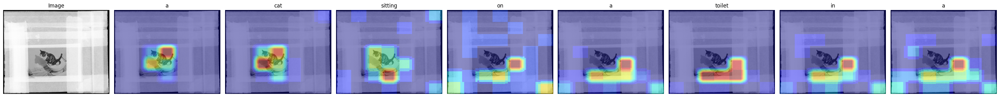


=== Image 20: COCO_train2014_000000033581.jpg ===
Generated caption: three three <unk> of a white cup of coffee .


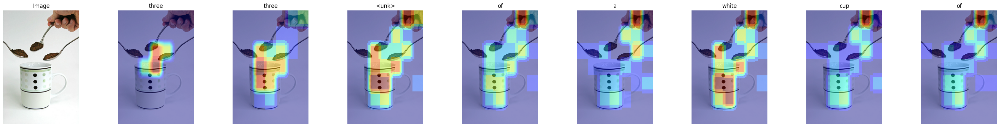

In [12]:
#@title Show multiple random images with captions + attention (OPTION 1)

NUM_IMAGES = 20

image_files = [f for f in os.listdir(IMG_DIR) if f.endswith(".jpg")]
random_images = random.sample(image_files, NUM_IMAGES)

for i, fn in enumerate(random_images, 1):
    print(f"\n=== Image {i}: {fn} ===")
    img_path = os.path.join(IMG_DIR, fn)
    pil_img = Image.open(img_path).convert("RGB")

    caption, words, attns = generate_with_attention(model, pil_img)

    print("Generated caption:", caption)
    show_word_attention(pil_img, words, attns, max_words=8)


In [14]:
#@title Pretty GUI Demo (Upload -> Caption + Optional Attention)
!pip -q install gradio

import gradio as gr
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import io, os

def _make_overlay(pil_img, attn_map, alpha=0.45):
    # attn_map: (H,W) numpy
    a = attn_map.astype(np.float32)
    a = (a - a.min()) / (a.max() - a.min() + 1e-8)

    # resize attention to image size
    att_img = Image.fromarray((a * 255).astype(np.uint8)).resize(pil_img.size, Image.BILINEAR)
    att_np = np.array(att_img) / 255.0

    fig = plt.figure(figsize=(6, 4))
    plt.imshow(pil_img)
    plt.imshow(att_np, cmap="jet", alpha=float(alpha))
    plt.axis("off")

    buf = io.BytesIO()
    plt.tight_layout(pad=0)
    plt.savefig(buf, format="png", dpi=170, bbox_inches="tight", pad_inches=0)
    plt.close(fig)
    buf.seek(0)
    return Image.open(buf).convert("RGB")

def _safe_generate(pil_img, beam_size=3, max_len=25):
    """
    Uses whichever generation function exists in your notebook:
    - generate_beam_with_attention(model, pil_img, ...)
    - generate_with_attention(model, pil_img, ...)
    Returns (caption, words, attns)
    """
    if "generate_beam_with_attention" in globals():
        return generate_beam_with_attention(model, pil_img, beam_size=int(beam_size), max_len=int(max_len))
    elif "generate_with_attention" in globals():
        # some versions may not accept beam args
        try:
            return generate_with_attention(model, pil_img, max_len=int(max_len))
        except TypeError:
            return generate_with_attention(model, pil_img)
    else:
        raise NameError("No generation function found. Please define generate_with_attention or generate_beam_with_attention.")

def caption_app(image, show_explain, beam_size, max_len, max_words, opacity):
    if image is None:
        return "Please upload an image.", []

    pil_img = Image.fromarray(image).convert("RGB")
    caption, words, attns = _safe_generate(pil_img, beam_size=beam_size, max_len=max_len)

    if not show_explain:
        return caption, []

    # Build per-word overlays
    gallery = []
    count = 0
    for w, a in zip(words[1:], attns):  # skip <start>
        if w in ("<end>", "<pad>"):
            break
        overlay = _make_overlay(pil_img, a, alpha=opacity)
        gallery.append((overlay, w))
        count += 1
        if count >= int(max_words):
            break

    return caption, gallery

css = """
#title {text-align:center; font-size: 28px; font-weight: 800; margin-bottom: 4px;}
#subtitle {text-align:center; color: #666; margin-top: 0px; margin-bottom: 14px;}
.gradio-container {max-width: 1100px !important;}
.footer-note {text-align:center; color:#888; font-size:12px;}
"""

with gr.Blocks(css=css, theme=gr.themes.Soft()) as demo:
    gr.Markdown("<div id='title'>Explainable Image Captioning Demo</div>")
    gr.Markdown("<div id='subtitle'>Upload an image → get a caption (and optional attention heatmaps per word)</div>")

    with gr.Row():
        with gr.Column(scale=5):
            inp = gr.Image(type="numpy", label="Upload Image", height=380)

            with gr.Row():
                show_explain = gr.Checkbox(value=True, label="Show Explainability (attention heatmaps)")

            with gr.Accordion("Generation Settings", open=False):
                beam = gr.Slider(1, 5, value=3, step=1, label="Beam size (if available)")
                max_len = gr.Slider(10, 40, value=25, step=1, label="Max caption length")
                max_words = gr.Slider(3, 15, value=8, step=1, label="Max heatmap words to display")
                opacity = gr.Slider(0.15, 0.75, value=0.45, step=0.05, label="Heatmap opacity")

            run = gr.Button("Generate Caption", variant="primary")

        with gr.Column(scale=6):
            out_caption = gr.Textbox(label="Generated Caption", lines=2, placeholder="Caption will appear here...")
            out_gallery = gr.Gallery(
                label="Word-level Attention Heatmaps",
                columns=3,
                height=420,
                allow_preview=True,
                show_label=True
            )

            gr.Markdown("<div class='footer-note'>Tip: If captions repeat words, try beam size 3–5 and keep explainability enabled for interpretation.</div>")

    run.click(
        fn=caption_app,
        inputs=[inp, show_explain, beam, max_len, max_words, opacity],
        outputs=[out_caption, out_gallery]
    )

demo.launch(share=True)


/tmp/ipython-input-2583542923.py:80: DeprecationWarning: The 'theme' parameter in the Blocks constructor will be removed in Gradio 6.0. You will need to pass 'theme' to Blocks.launch() instead.
  with gr.Blocks(css=css, theme=gr.themes.Soft()) as demo:
/tmp/ipython-input-2583542923.py:80: DeprecationWarning: The 'css' parameter in the Blocks constructor will be removed in Gradio 6.0. You will need to pass 'css' to Blocks.launch() instead.
  with gr.Blocks(css=css, theme=gr.themes.Soft()) as demo:


Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://5ab1a4e23e0651445d.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
